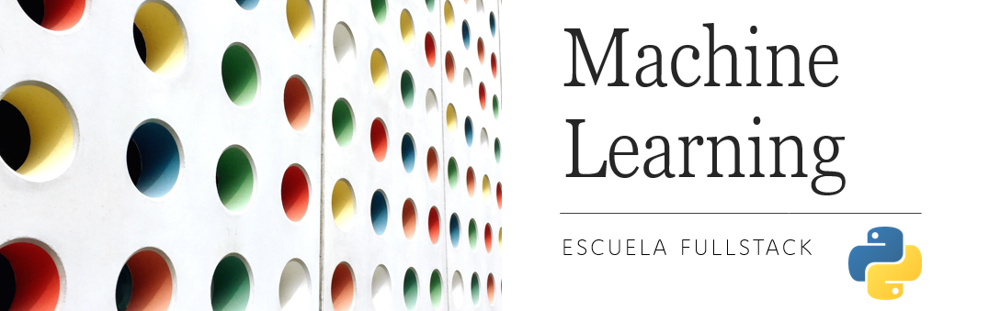

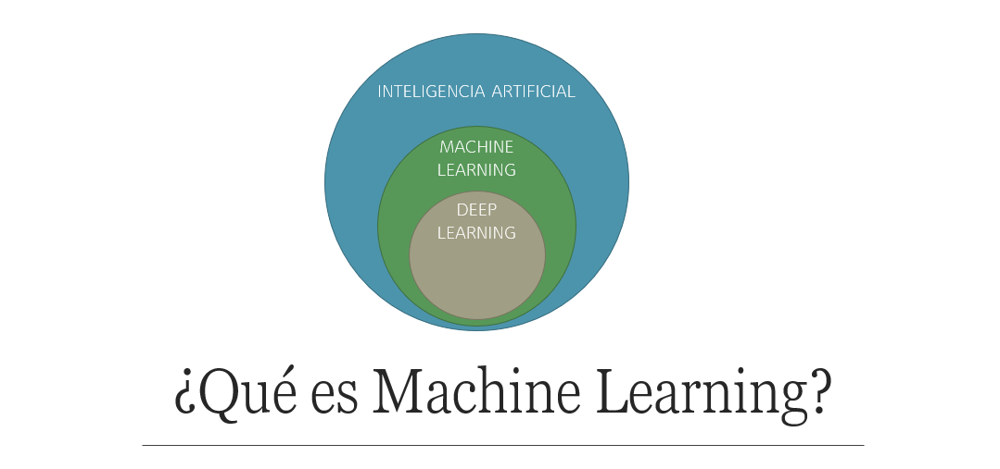

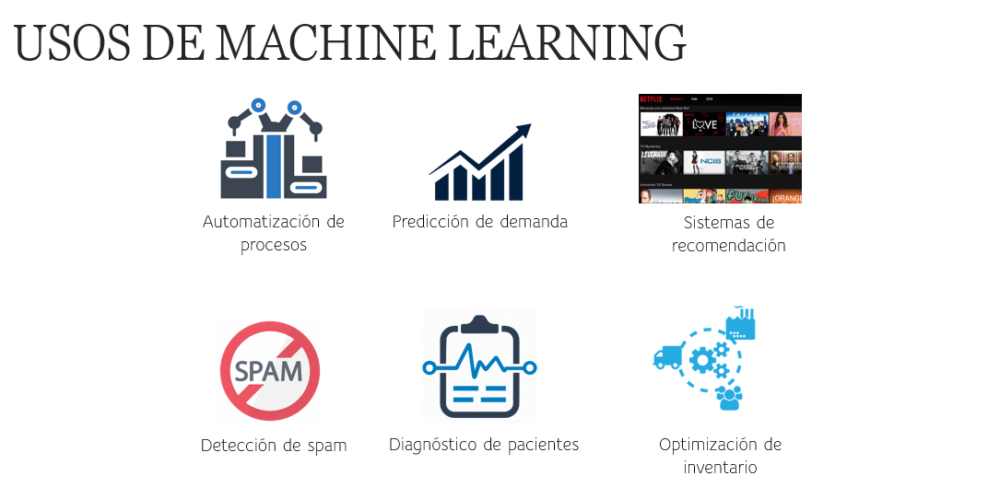

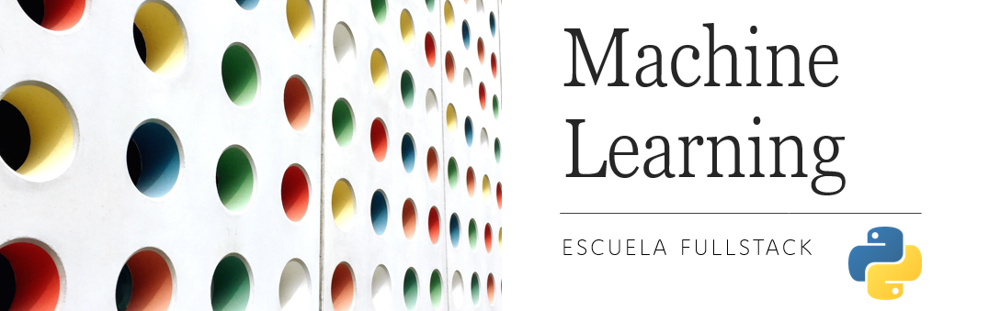

## **Machine Learning Sección 2**
### **Conceptos Básicos de Machine Learning**

En esta sección cubriremos los conceptos:
- Variables de un modelo
- Aprendizaje supervisado
- Aprendizaje no supervisado
- Diferencias entre aprendizaje supervisado y no supervisado
- Validación de modelos
- Metodología CRISP-DM
- Machine Learning vs. Analytics
- Machine Learning en Python

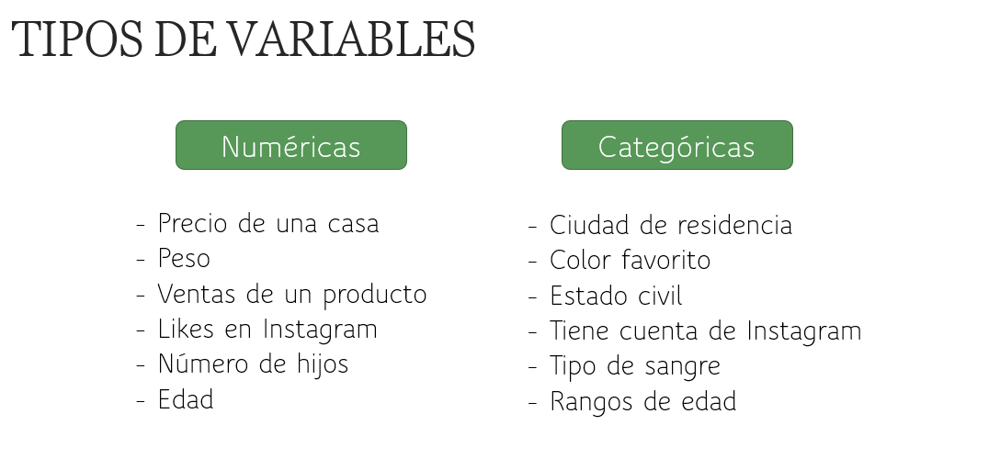

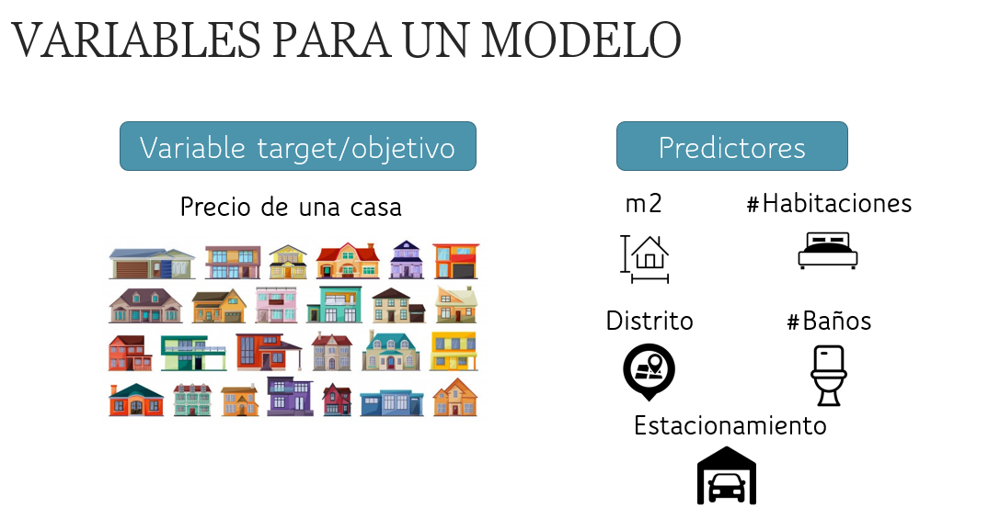

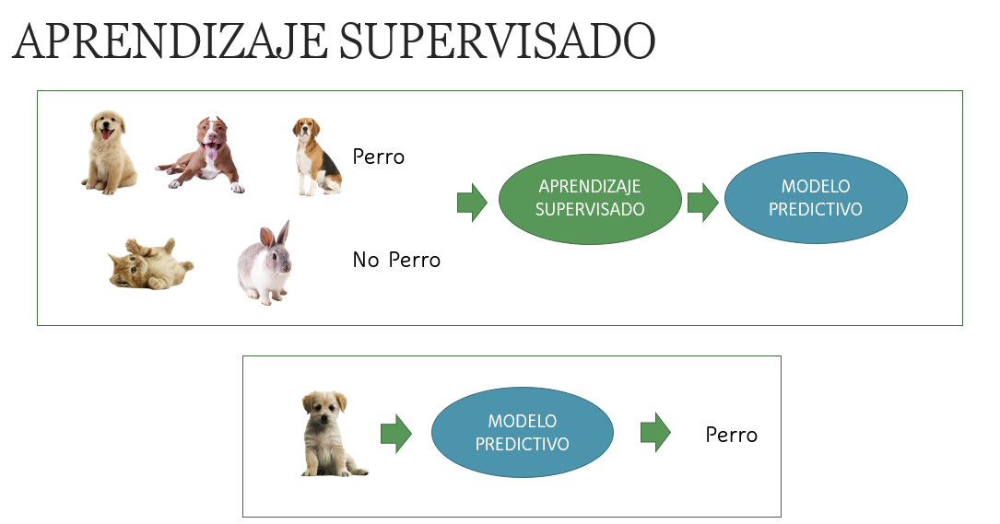

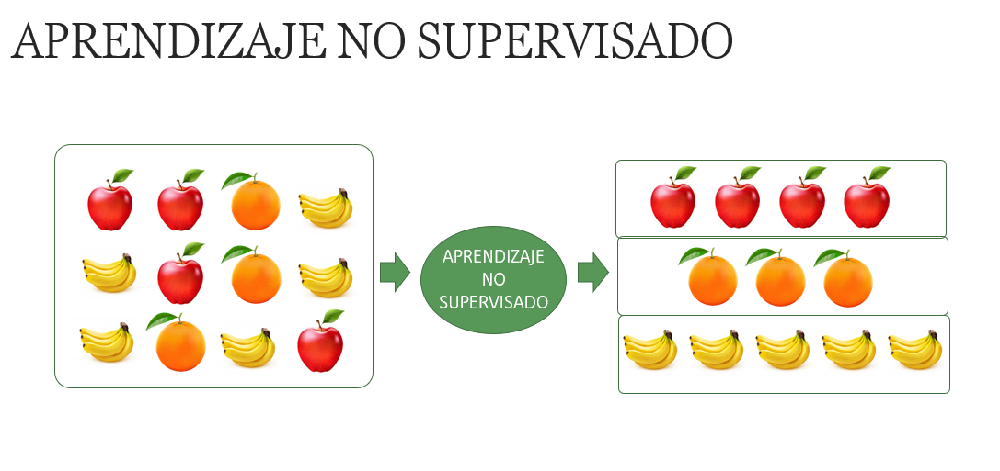

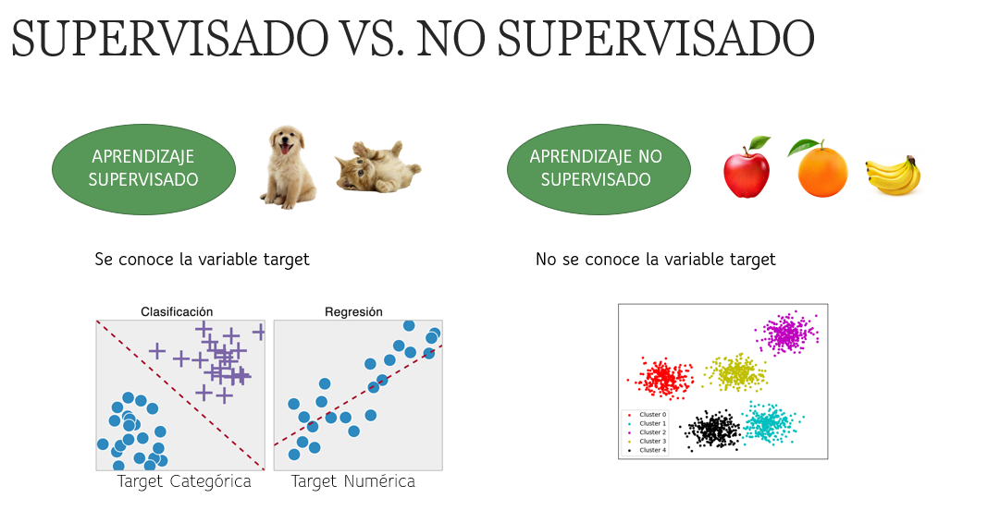

...

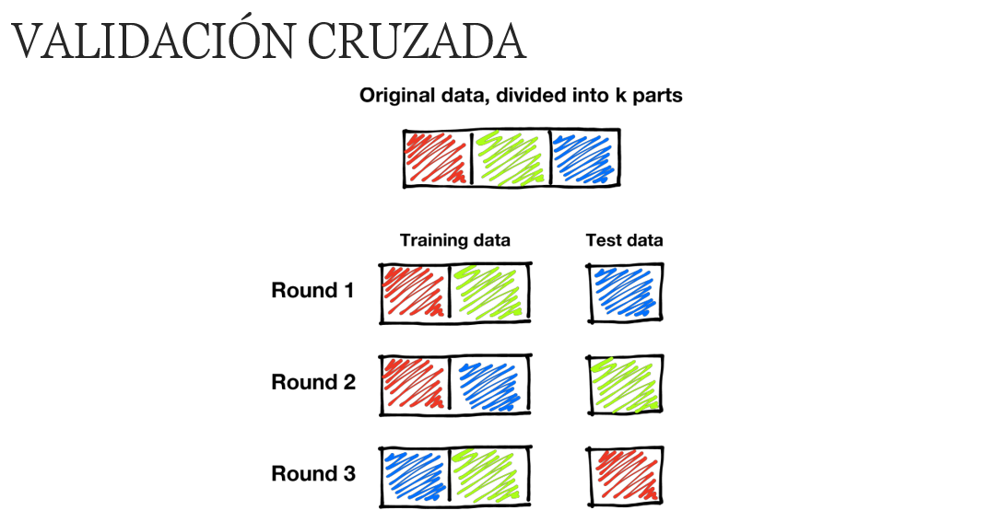

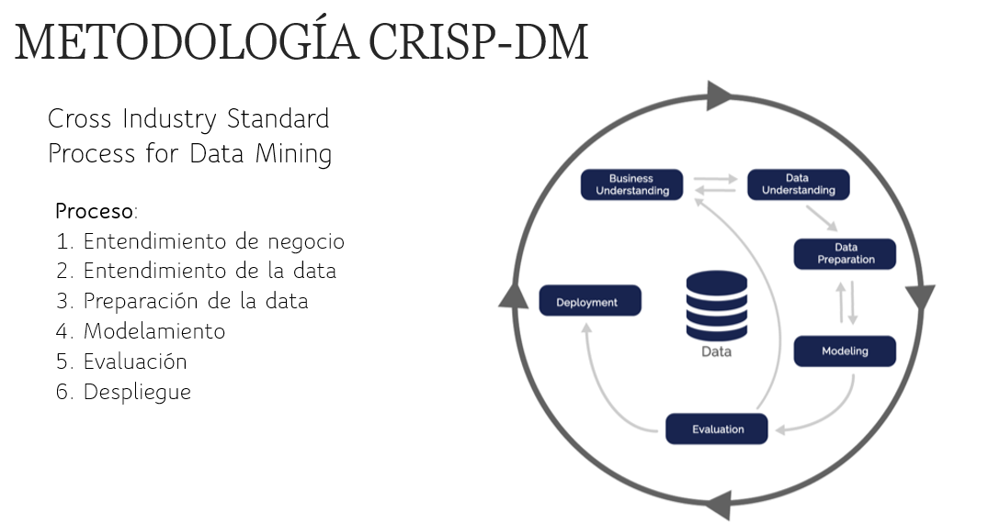

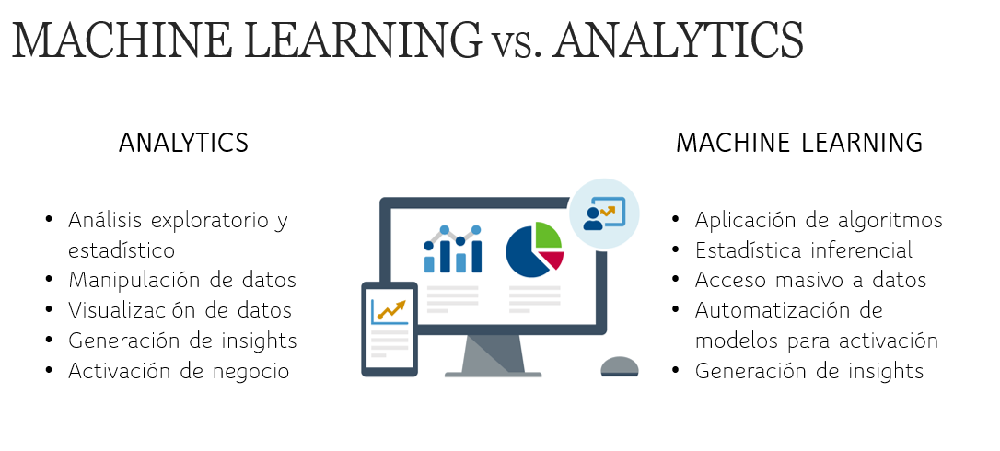

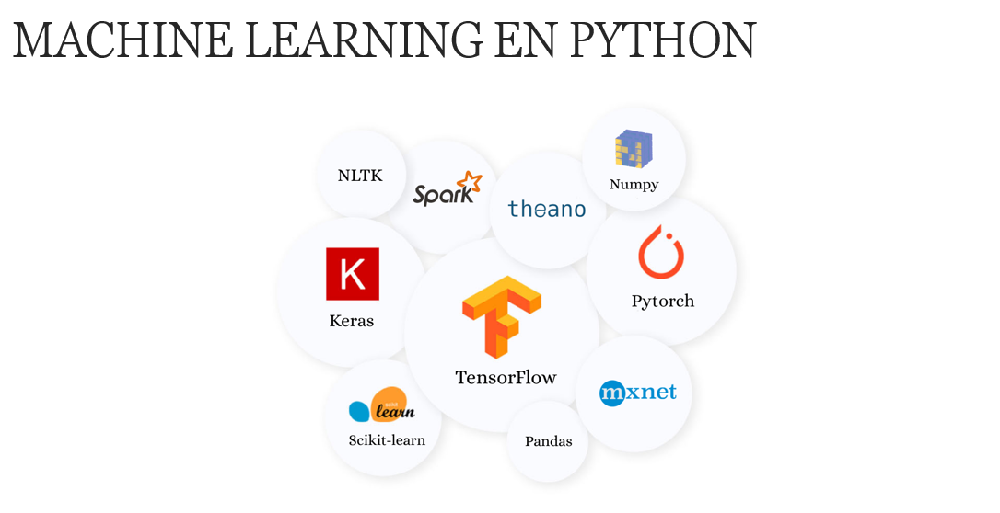

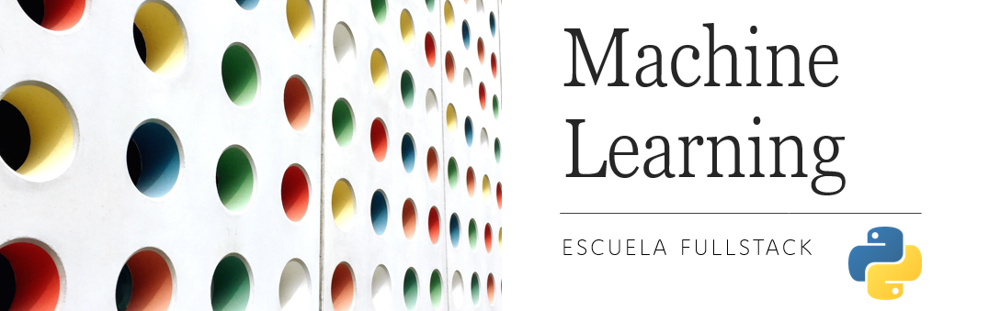

## **Machine Learning Sección 3**
### **Transformación de los datos para un modelo**

En esta sección cubriremos los conceptos:
- Tidy data
- Limpieza de valores nulos o faltantes
- Selección de la variable target y predictores
- Reducción de dimensiones
- Sets de entrenamiento y prueba
- Caso aplicativo

Para este ejercicio usaremos datasets del portal Kaggle

- https://www.kaggle.com/aungpyaeap/supermarket-sales

- https://www.kaggle.com/heptapod/titanic

In [ ]:
#Importamos la librería pandas para manejo de DataFrame

import pandas as pd

In [ ]:
#Leyendo datos de un archivo csv
from google.colab import files
#cargar = files.upload()

df = pd.read_csv("/content/titanic_data.csv",sep=",")
df.head()

In [ ]:
#Datos del Dataframe: lista de columnas

df.columns

In [ ]:
#Datos del Dataframe: dimensiones

df.shape

In [ ]:
#Datos del Dataframe: detalles de los datos cada columna numérica

df.describe()

In [ ]:
#Datos del Dataframe: tipo de datos por columna

df.dtypes

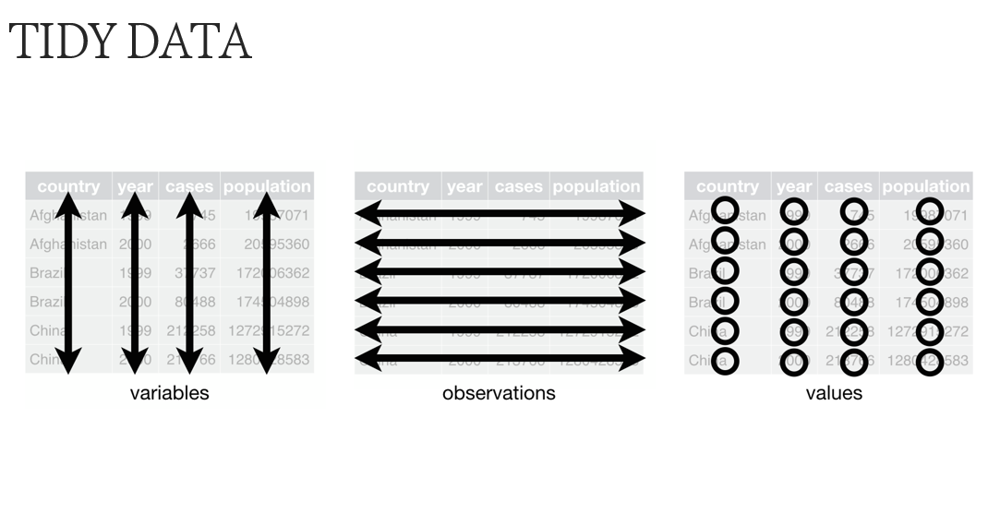

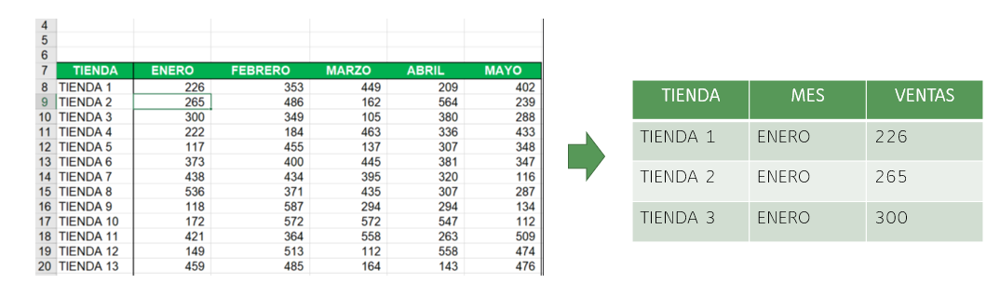

## Limpieza de Datos

Generalmente los datasets no son siempre completos ni sus datos llenados u obtenidos de forma correcta o uniforme en el tiempo.

Es por esto que un paso muy importante al preparar nuestro dataset para el análisis es evaluar si existen datos vacíos, nulos o outliers.

Una vez evaluados debemos decidir qué hacer con ellos, por ejemplo podríamos:
- Eliminar dichas observaciones
- Reemplazarlas por un valor constante
- Reemplazarlas por otros valores del dataset (promedio, moda, otros)
- Calcular un valor aproximado con otros modelos (como Regresión)

Se debe considerar la naturaleza de los datos para decidir, ya que los valores nulos o faltantes podrían deberse a una falla en la captura de los datos o que el usuario no respondió una pregunta, entre otras razones. Todos estos factores deben ser considerados para la decisión de cómo lidiar con dichos valores.

In [ ]:
## Evaluación de datos faltantes o vacíos mediante la función isna()

df.isna().sum()

In [ ]:
#Revisando los valores faltantes de Embarked = Punto de embarque

df[df["Embarked"].isna()]

In [ ]:
#Eliminando valores vacíos

df1 = df.dropna(subset=["Embarked"], axis=0)
df1.isna().sum()

In [ ]:
#Revisando los valores de cabinas

df1["Cabin"].unique()

In [ ]:
#Revisando los valores faltantes de Age = Edad

df1[df1["Cabin"].isna()]

In [ ]:
#Reemplazando valores vacíos por un valor específico

df1["Cabin"] = df1["Cabin"].fillna("Unknown")
df1.isna().sum()

In [ ]:
#Revisando los valores faltantes de Age = Edad

df1[df1["Age"].isna()]

In [ ]:
#Crear una columna con el título de cada persona, para reemplazar valores faltantes de la edad por la mediana por título
#Usamos regular expressions (https://docs.python.org/3/howto/regex.html)

df1["Title"] = df["Name"].str.extract("([A-Za-z]+)\.", expand=True)

In [ ]:
#Incluir edades faltantes de acuerdo al mismo título

#Primero obtenemos las edades por Title
age_title = dict(df1.groupby("Title")["Age"].median())

#Luego creamos una columna interina con los valores
df1["Age_int"] = df1["Title"].apply(lambda x: age_title[x])

#Por último reemplazamos los valores faltantes con fillna y eliminamos la columna interina
df1["Age"].fillna(df1["Age_int"], inplace=True)
del df1["Age_int"]

df1.head()

In [ ]:
#Cómo quedó finalmente el dataset
df1.isna().sum()

## Selección de la variable target y predictores

- Comenzando con la metodología CRISP-DM, para este punto debemos empezar por entender con los stakeholders de la pregunta de negocio o caso cuál es el problema a resolver (entendimiento del negocio).

- Una vez entendido, pasamos a explorar los datos (ya hicimos ciertas revisiones previas) para determinar nuestra variable target o variable dependiene (la que queremos explicar).

- Luego buscamos qué otras variables pueden ser "predictores" de nuestra variable target, es decir pueden explicarla. Esta es una hipótesis, ya que con nuestros modelos identificaremos si efectivamente ses un predictor adecuado.

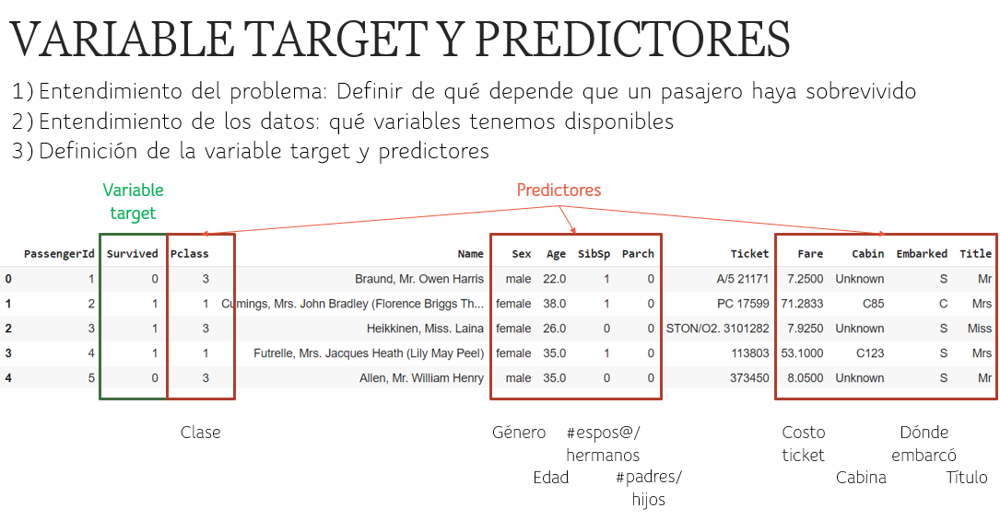

In [ ]:
#Crear nuevo dataset solo con las variables del modelo
df2 = df1[["Survived","Pclass","Sex","Age","SibSp","Parch","Fare","Cabin","Embarked","Title"]]
df2.head()

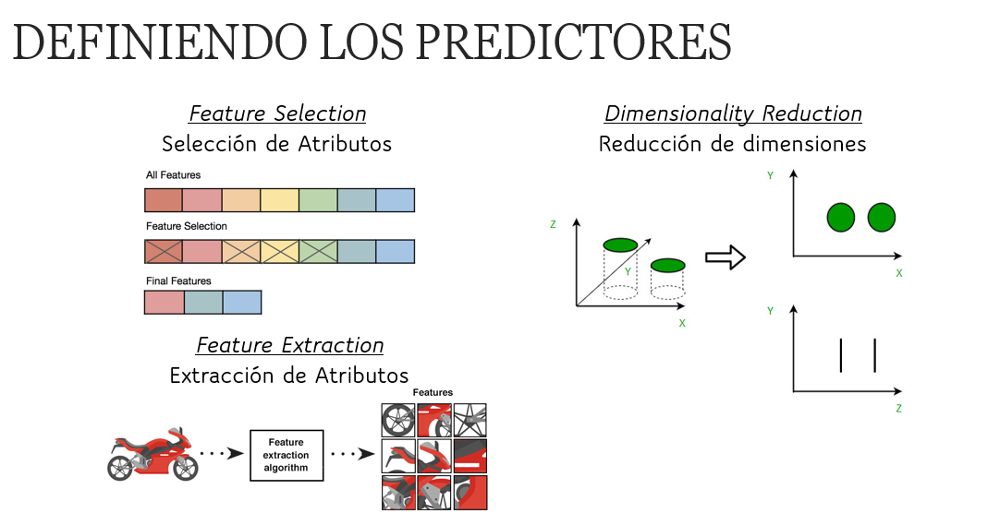

Para nuestro caso comenzaremos usando Feature Selection ya que según el entendimiento del negocio inicialmente podríamos encontrar buenos predictores a partir de las variables ya disponibles (no hay necesidad de incluir nuevos atributos extraidos).

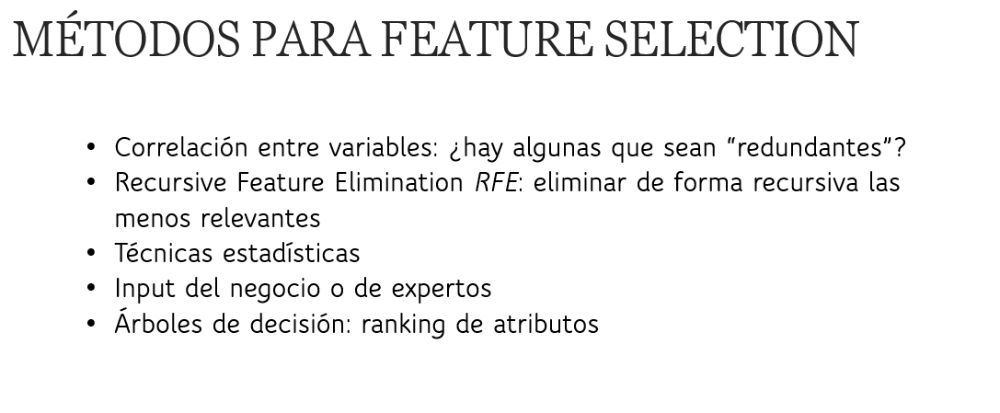

Sin embargo, antes de iniciar la selección, debemos procesar las variables para factorizarlas o crear indicadores de forma que sea más fácil procesarlas.

Por ejemplo, si tenemos variables categóricas, como Género Male/Female podemos definir una nueva variable que sea "Is Male" y que solo indique si es de género masculino o no.

O se puede factorizar asignando valores a cada opción de la variable, por ejemplo en una lista de ciudades, cada ciudad se le asigna un valor.

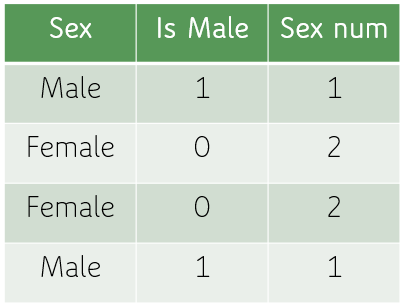

In [ ]:
#Entonces vamos a ajustar las variables categóricas

import numpy as np

df2["Is Male"] = np.where(df2["Sex"]=="male",1,0)
df2.head()

In [ ]:
df2["Embarked"].unique()

In [ ]:
#Incluir columnas de embarque

df2["Embarked S"] = np.where(df2["Embarked"]=="S",1,0)
df2["Embarked C"] = np.where(df2["Embarked"]=="C",1,0)
df2["Embarked Q"] = np.where(df2["Embarked"]=="Q",1,0)
df2.head()

In [ ]:
#Para simplificar los factores de Título, usaremos solo los principales

df2["Title"].value_counts()

In [ ]:
#Incluir columnas de embarque

df2["Title Mr"] = np.where(df2["Title"]=="Mr",1,0)
df2["Title Miss"] = np.where(df2["Title"]=="Miss",1,0)
df2["Title Mrs"] = np.where(df2["Title"]=="Mrs",1,0)
df2["Title Master"] = np.where(df2["Title"]=="Master",1,0)
df2.head()

Ya que la variable categórica de cabina es bastante amplia, vamos a eliminarla asumiendo que fue validada con el experto en el negocio (quien definió el problema a resolver).

In [ ]:
#Ahora eliminamos las variables categóricas que ya no usaremos
df2 = df2.drop(["Sex","Cabin","Embarked","Title"],axis=1)
df2.head()

## Sets de entrenamiento y prueba

Para poder validar posteriormente nuestro modelo, y evitar el *overfitting* debemos definir conjuntos de datos dentro del dataset que puedan servirnos para entrenar el modelo en primer lugar, y luego validar en puntos que no fueron usados inicialmente. De esta forma logramos asegurar que el modelo funciona en puntos no considerados en la definición del modelo, y puede servir con nuevos puntos a futuro.

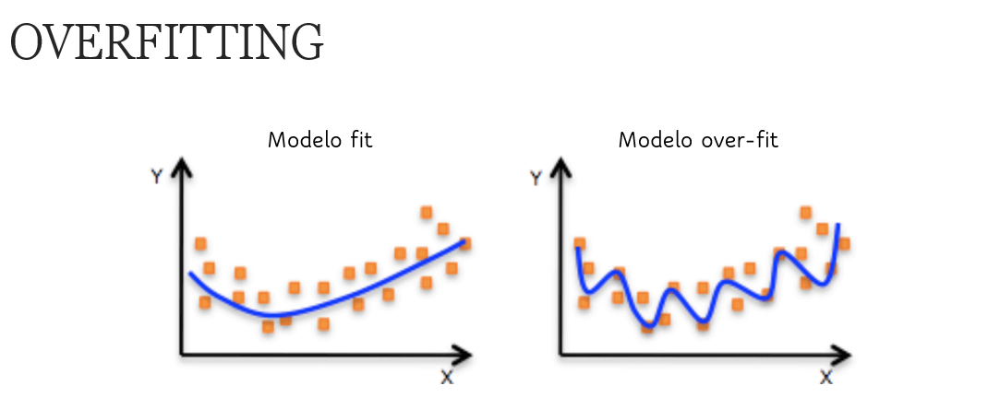

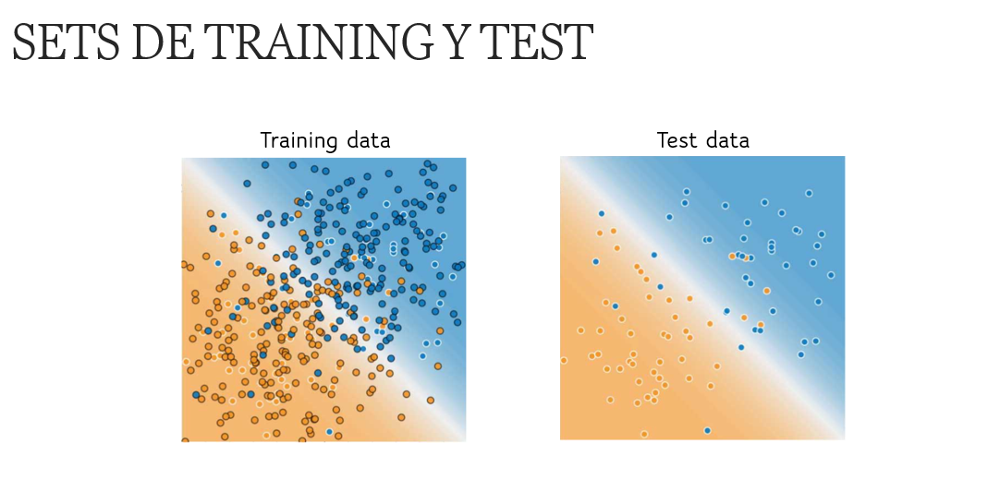

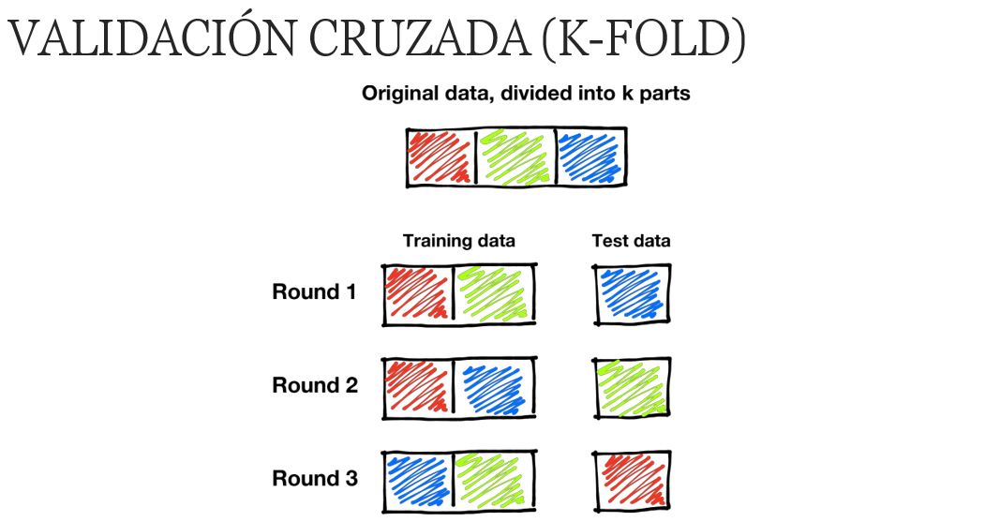

Estos datasets generalmente se definen entre 70%-80% de puntos en el training set y 30-20% de puntos en el test set, pero es variable de acuerdo a cada caso de uso. 

Por otro lado, cómo se definen dichos puntos es también un tópico que debe ser evaluado por el analista o científico de datos, ya que debe asegurar que sea balanceado o en el caso de usar validación cruzada, debe definir cuántas partes "k" serán usadas. 

Para estos casos hay varias técnicas que no se cubrirán en el curso pero hay mucha bibliografía al respecto disponible en Internet.


In [ ]:
#Ahora separaremos nuestros datasets de training (entrenamiento) y test (prueba)

from sklearn.model_selection import train_test_split

#Definimos los datasets X e y con la variable target y los predictores
y = df2["Survived"]
X = df2.drop(["Survived"],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1987)


In [ ]:
X_train.shape

In [ ]:
X_test.shape

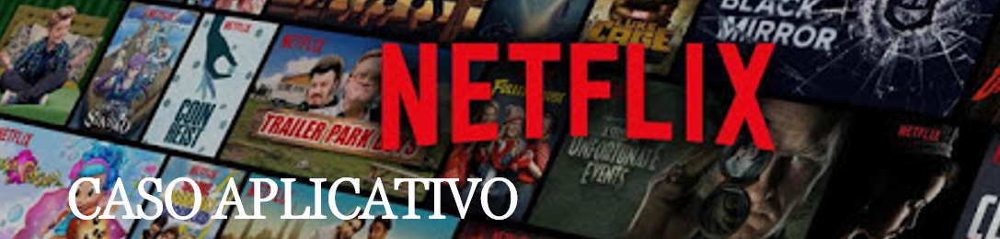

Para nuestro caso aplicativo, vamos a usar los datos libres de la web de Kaggle sobre Netflix e IMDB.

- https://www.kaggle.com/shivamb/netflix-shows
- https://www.kaggle.com/stefanoleone992/imdb-extensive-dataset


In [ ]:
#Leyendo los datos del caso aplicativo
from google.colab import files
#cargar = files.upload()

dfp = pd.read_csv("/content/netflix_titles.csv",sep=",")
dfp.head()

In [ ]:
#Leyendo los datos complementarios del caso aplicativo
from google.colab import files
#cargar = files.upload()

ratings = pd.read_csv("/content/IMDb ratings.csv",sep=",",usecols=["weighted_average_vote"])
ratings.head()

In [ ]:
#Leyendo los datos complementarios del caso aplicativo
from google.colab import files
cargar = files.upload()

titulos = pd.read_csv("/content/IMDb movies.csv",sep=",",usecols=["title","year","genre"])
titulos.head()

In [ ]:
#Consolidando ambos datasets en uno

ratings2 = pd.DataFrame({"title":titulos.title,
                    "year":titulos.year,
                    "rating": ratings.weighted_average_vote,
                    "genre":titulos.genre})

ratings2.head()

In [ ]:
#Eliminando duplicados previo a la unión de ambas tablas

ratings2 = ratings2.drop_duplicates(subset=["title","year","rating"])
ratings2.head()

In [ ]:
#Eliminando datos vacíos

ratings2 = ratings2.dropna()

In [ ]:
#Agrupar ambas tablas: Netflix y ratings de películas

dfp1 = dfp.merge(ratings2,on="title",how="inner",suffixes = ["_Netflix","_IMDB"])
dfp1.head()

In [ ]:
#Datos del Dataframe: detalles de datos vacíos

dfp1.isna().sum()

In [ ]:
#Excluiremos las líneas con valores nulos de fecha y llenaremos los datos vacíos de director, cast, country y rating

dfp1["director"] = dfp1["director"].fillna("Unknown")
dfp1["cast"] = dfp1["cast"].fillna("Unknown")
dfp1["country"] = dfp1["country"].fillna("Unknown")
dfp1["rating_Netflix"] = dfp1["rating_Netflix"].fillna("Unknown")

dfp1 = dfp1.dropna()

In [ ]:
#Cambiando a formato de fecha

dfp1["date_added"] = pd.to_datetime(dfp1["date_added"])
dfp1["day_added"] = dfp1["date_added"].dt.day
dfp1["year_added"] = dfp1["date_added"].dt.year
dfp1["month_added"] = dfp1["date_added"].dt.month
dfp1["year_added"].astype(int)
dfp1["day_added"].astype(int)
dfp1["month_added"].astype(int)

dfp1.head()

In [ ]:
#Accediendo a los datos únicos del dataset

dfp1.nunique()

In [ ]:
dfp1["type"].unique()

In [ ]:
#Creando variables

dfp1["Is_movie"] = np.where(dfp1["type"] == "Movie",1,0)

In [ ]:
#Creamos una nueva columna de Duración numérica

dfp1["duration_num"] = dfp1["duration"].replace([" min"," Seasons"," Season"],"",regex=True).astype(int)

dfp1.head(2)

In [ ]:
#Revisando los géneros de IMDB

dfp1["genre"].unique()

In [ ]:
#Incluyendo variables de género

dfp1["Genre_Adventure"] = np.where(dfp1["genre"].str.contains("Adventure"),1,0)
dfp1["Genre_Comedy"] = np.where(dfp1["genre"].str.contains("Comedy"),1,0)
dfp1["Genre_Drama"] = np.where(dfp1["genre"].str.contains("Drama"),1,0)
dfp1["Genre_Crime"] = np.where(dfp1["genre"].str.contains("Crime"),1,0)
dfp1["Genre_Thriller"] = np.where(dfp1["genre"].str.contains("Thriller"),1,0)
dfp1["Genre_Action"] = np.where(dfp1["genre"].str.contains("Action"),1,0)
dfp1["Genre_Animation"] = np.where(dfp1["genre"].str.contains("Animation"),1,0)
dfp1["Genre_Romance"] = np.where(dfp1["genre"].str.contains("Romance"),1,0)
dfp1["Genre_Mystery"] = np.where(dfp1["genre"].str.contains("Mystery"),1,0)
dfp1["Genre_SciFi"] = np.where(dfp1["genre"].str.contains("Sci-Fi"),1,0)
dfp1["Genre_Musical"] = np.where(dfp1["genre"].str.contains("Musical"),1,0)
dfp1["Genre_Family"] = np.where(dfp1["genre"].str.contains("Family"),1,0)
dfp1.head()

In [ ]:
#Revisando los países

dfp1["country"].unique()

In [ ]:
#Incluyendo variables de país

dfp1["United_States"] = np.where(dfp1["country"].str.contains("United States"),1,0)
dfp1["India"] = np.where(dfp1["country"].str.contains("India"),1,0)
dfp1["United_Kingdom"] = np.where(dfp1["country"].str.contains("United Kingdom"),1,0)
dfp1["China"] = np.where(dfp1["country"].str.contains("China"),1,0)
dfp1["Canada"] = np.where(dfp1["country"].str.contains("Canada"),1,0)
dfp1["Germany"] = np.where(dfp1["country"].str.contains("Germany"),1,0)
dfp1["France"] = np.where(dfp1["country"].str.contains("France"),1,0)
dfp1["Australia"] = np.where(dfp1["country"].str.contains("Australia"),1,0)
dfp1["Mexico"] = np.where(dfp1["country"].str.contains("Mexico"),1,0)
dfp1["Spain"] = np.where(dfp1["country"].str.contains("Spain"),1,0)
dfp1["South_Korea"] = np.where(dfp1["country"].str.contains("South Korea"),1,0)
dfp1["Belgium"] = np.where(dfp1["country"].str.contains("Belgium"),1,0)
dfp1.head()

In [ ]:
#Seleccionando solo las variables numéricas

dfp2 = dfp1.select_dtypes(['number'])
dfp2.drop("show_id",axis=1, inplace=True)
dfp2.head()

In [ ]:
#Definimos los datasets X e y con la variable target y los predictores
yp = dfp2["rating_IMDB"]
Xp = dfp2.drop(["rating_IMDB"],axis=1)

X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(Xp, yp, test_size=0.3, random_state=1987)

In [ ]:
X_train_p.shape

In [ ]:
X_test_p.shape

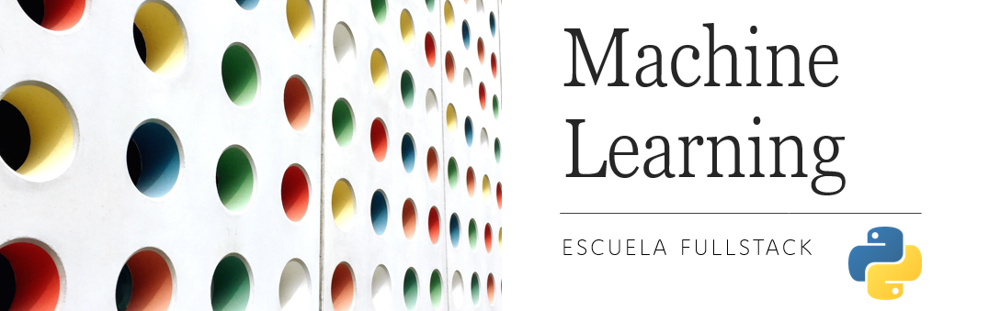

## **Machine Learning Sección 4**
### **Modelamiento**

En esta sección cubriremos los conceptos:
- Identificación del modelo a usar
- Análisis exploratorio y visualización de datos
- Regresión lineal
- Regresión logística
- Árbol de decisión
- Clustering K-means

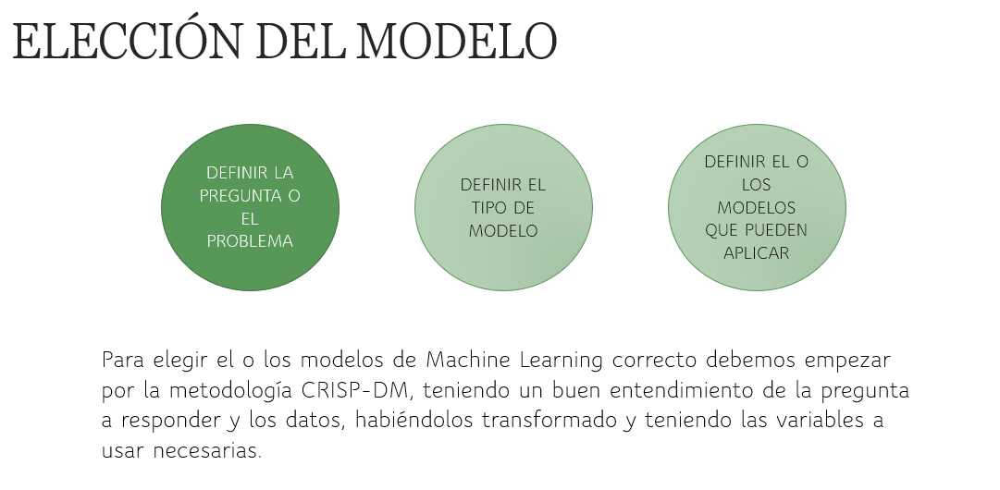

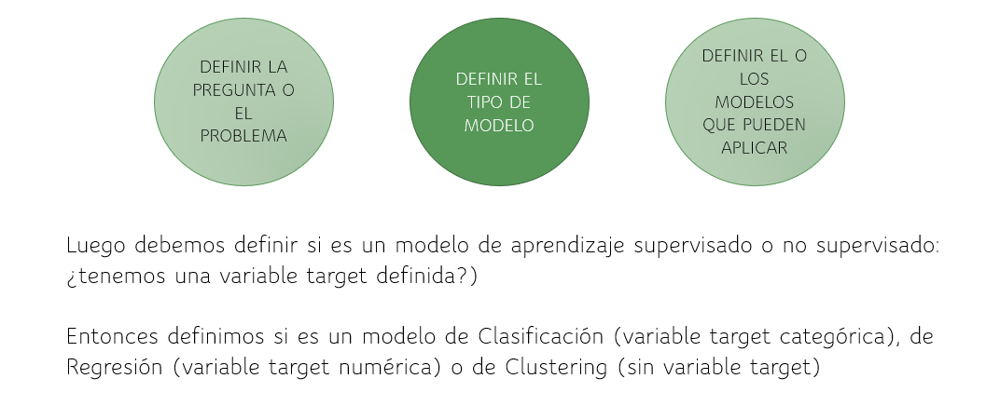

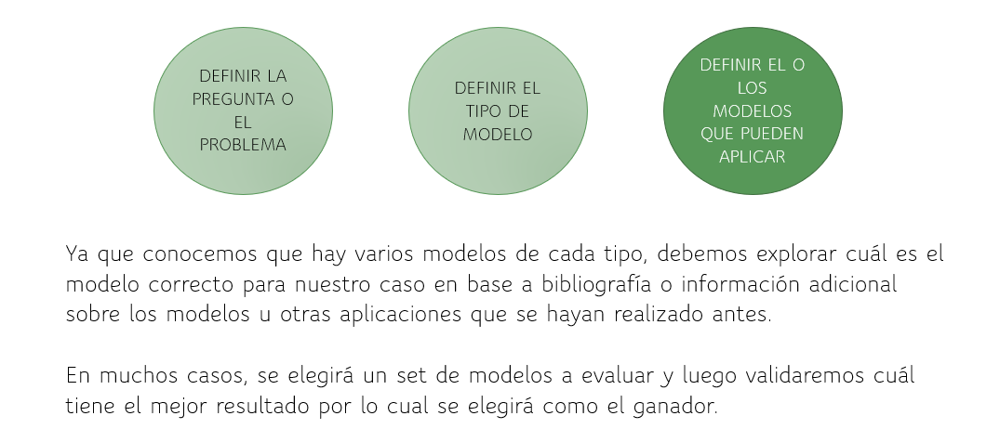

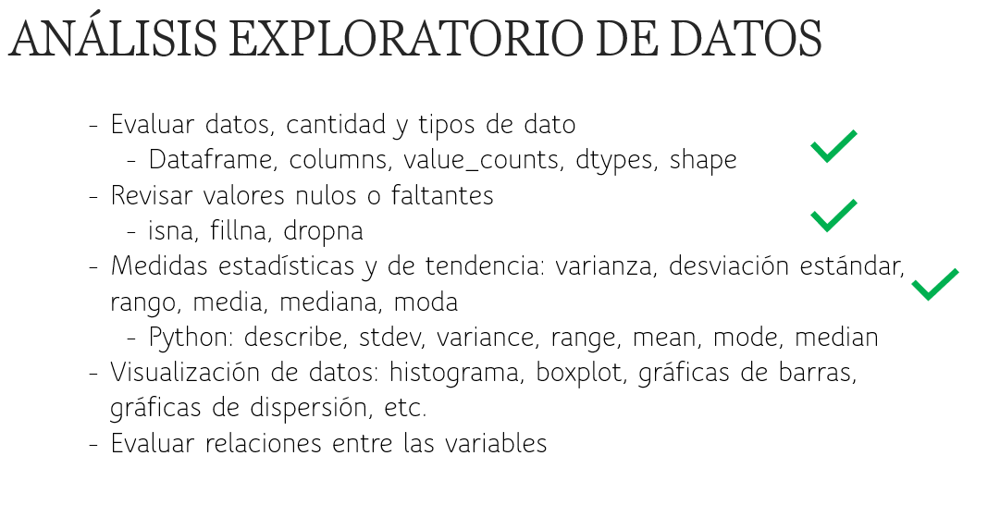

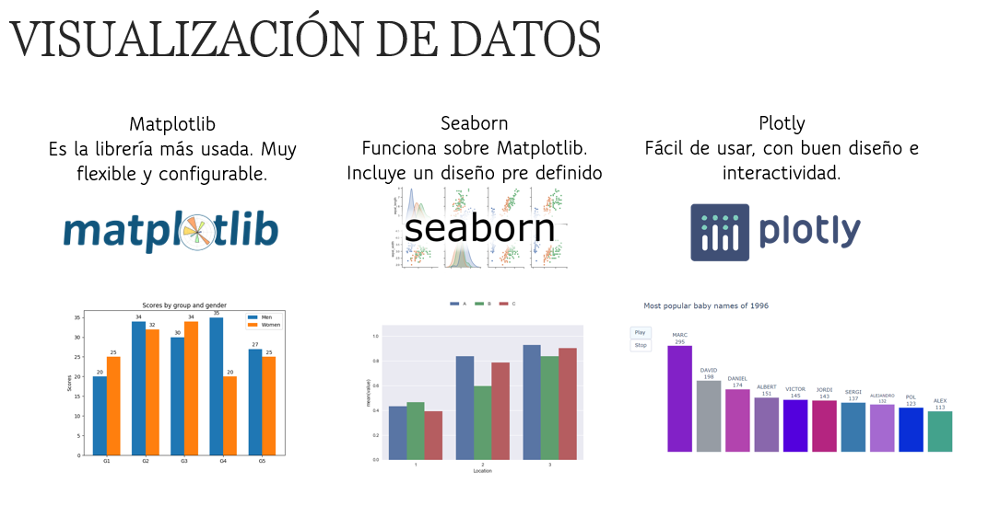

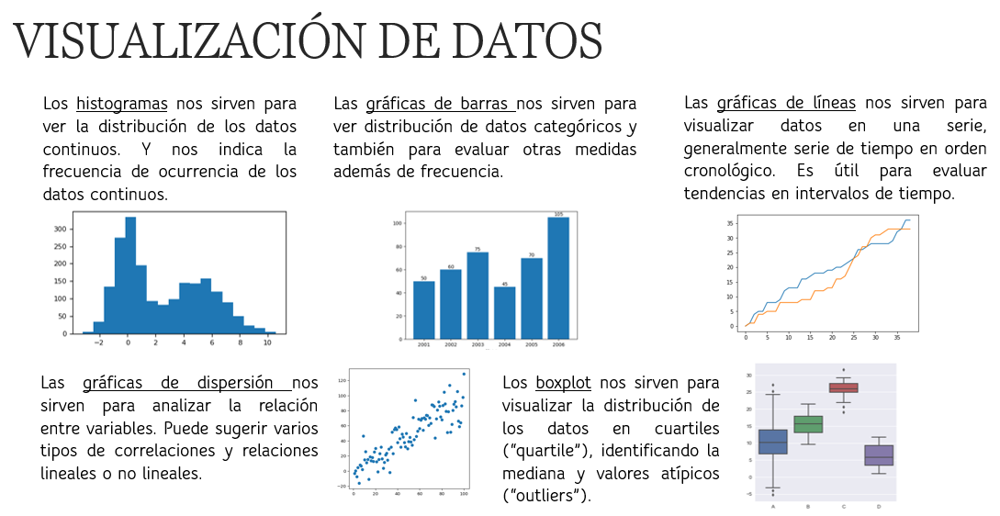

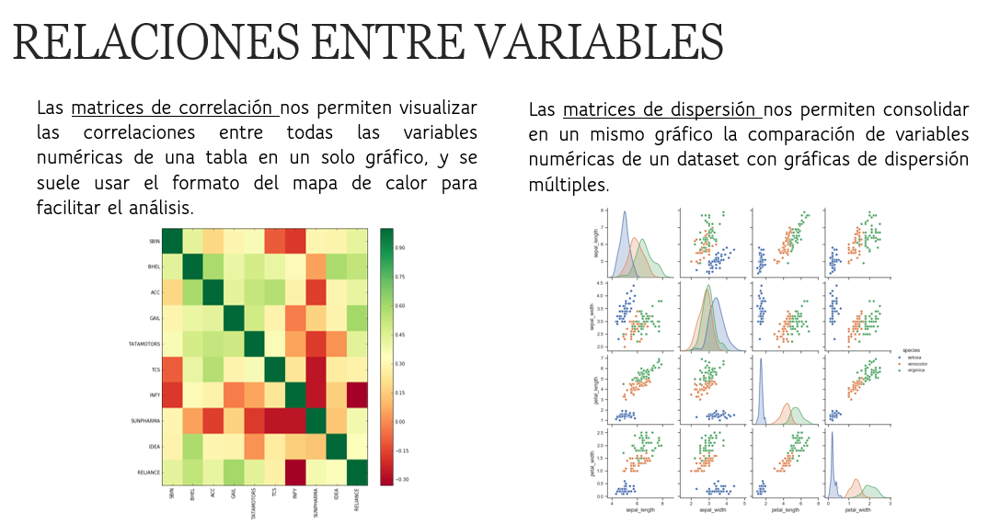

In [ ]:
#Importamos las librerías de visualización

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

In [ ]:
#Creando un histograma para ver la distribución de sobrevivientes

plt.hist(y)
plt.show()

In [ ]:
#Creando un histograma para ver la distribución de pasajeros por clase

plt.hist(X["Pclass"])
plt.show()

In [ ]:
#Creando un histograma con seaborn para ver la distribución de pasajeros por edad

sns.distplot(X["Age"])
plt.show()

In [ ]:
#Creando un boxplot para ver la distribución de pasajeros por tarifa

sns.boxplot(X["Fare"])
plt.show()

In [ ]:
#Evaluando una matriz de correlación en formato heatmap

sns.heatmap(df2.corr(), cmap="RdYlGn", annot=True, fmt=".1f")
plt.show()

In [ ]:
#Visualizando una matriz de dispersión con seaborn

sns.pairplot(df1)
plt.show()

In [ ]:
#Evaluando la variable target en base a las demás

sns.barplot(x='Sex', y='Survived', data=df1,palette="magma")
plt.show()

In [ ]:
#Evaluando la variable target en base a las demás

sns.barplot(x='Pclass', y='Survived', data=df1,palette="magma")
plt.show()

In [ ]:
#Evaluando la variable target en base a las demás

sns.barplot(x='Embarked', y='Survived', data=df1,palette="magma")
plt.show()

In [ ]:
#Evaluando la variable target en base a las demás

sns.barplot(x='Title', y='Survived', data=df1,palette="magma")
plt.xticks(rotation=90)
plt.show()

# Regresión Lineal

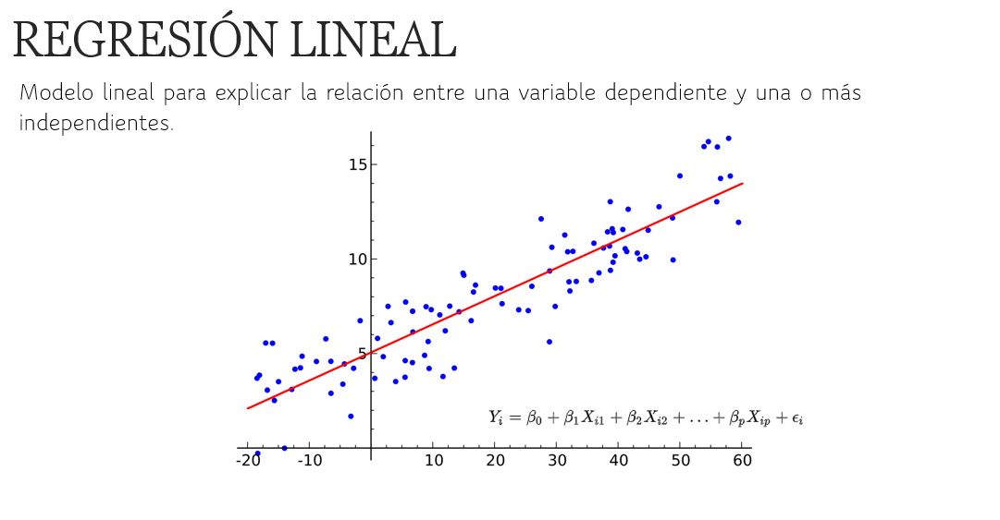

In [61]:
#Importamos la librería de statsmodels
import statsmodels.api as sm

#Añadiendo una constante para el cálculo del Intercept
X_train = sm.add_constant(X_train)

#Entrenamos el modelo
model = sm.OLS(y_train,X_train).fit()

print(model.summary())

                            OLS Regression Results                            
Dep. Variable:               Survived   R-squared:                       0.461
Model:                            OLS   Adj. R-squared:                  0.451
Method:                 Least Squares   F-statistic:                     43.48
Date:                Sun, 04 Oct 2020   Prob (F-statistic):           7.07e-74
Time:                        15:24:53   Log-Likelihood:                -236.57
No. Observations:                 622   AIC:                             499.1
Df Residuals:                     609   BIC:                             556.8
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.8684      0.164      5.309   

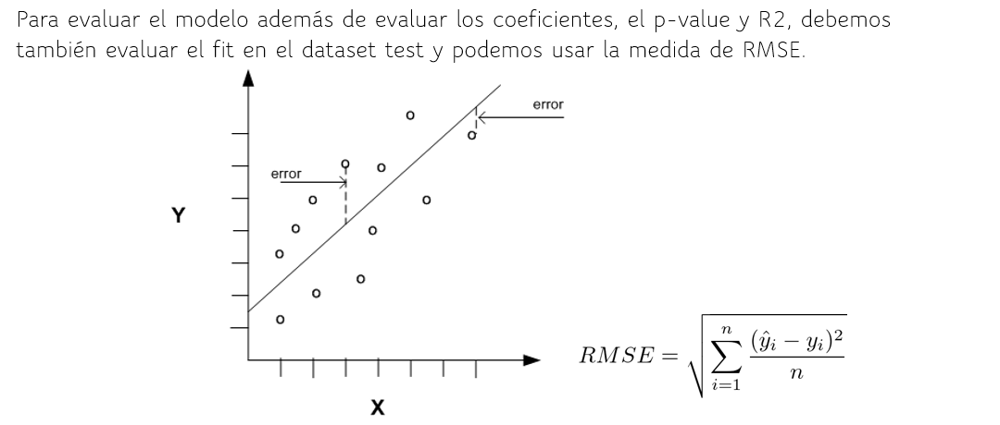

In [62]:
from sklearn import metrics

#Añadiendo una constante para el cálculo del Intercept
X_test = sm.add_constant(X_test)

#Predicción en el dataset de test
y_pred = model.predict(X_test)

#RMSE
print(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

0.38934203949057233


In [63]:
#Incluyendo nuevas columnas según input del primer modelo

df2["Pclass 1"] = np.where(df2["Pclass"]==1,1,0)
df2["Pclass 2"] = np.where(df2["Pclass"]==2,1,0)
df2["Pclass 3"] = np.where(df2["Pclass"]==3,1,0)

df2["Family Size"] = df2["SibSp"] + df2["Parch"]

df2.drop(["Pclass","SibSp","Parch"],axis=1,inplace=True)

df2.head()

,Survived,Age,Fare,Is Male,Embarked S,Embarked C,Embarked Q,Title Mr,Title Miss,Title Mrs,Title Master,Pclass 1,Pclass 2,Pclass 3,Family Size
0,0,22.0,7.2500,1,1,0,0,1,0,0,0,0,0,1,1
1,1,38.0,71.2833,0,0,1,0,0,0,1,0,1,0,0,1
2,1,26.0,7.9250,0,1,0,0,0,1,0,0,0,0,1,0
3,1,35.0,53.1000,0,1,0,0,0,0,1,0,1,0,0,1
4,0,35.0,8.0500,1,1,0,0,1,0,0,0,0,0,1,0


In [64]:
#Redefinimos los datasets X e y con la variable target y los predictores
df2.drop(["Title Mr","Title Miss","Title Mrs"],axis=1,inplace=True)

y = df2["Survived"]
X = df2.drop(["Survived"],axis=1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1987)

In [65]:
#Añadiendo una constante para el cálculo del Intercept
X_train = sm.add_constant(X_train)

#Entrenamos el modelo
model2 = sm.OLS(y_train,X_train).fit()

print(model2.summary())

                            OLS Regression Results                            
Dep. Variable:               Survived   R-squared:                       0.454
Model:                            OLS   Adj. R-squared:                  0.446
Method:                 Least Squares   F-statistic:                     56.51
Date:                Sun, 04 Oct 2020   Prob (F-statistic):           1.17e-74
Time:                        15:39:27   Log-Likelihood:                -240.92
No. Observations:                 622   AIC:                             501.8
Df Residuals:                     612   BIC:                             546.2
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.5184      0.032     16.408   

In [66]:
#Añadiendo una constante para el cálculo del Intercept
X_test = sm.add_constant(X_test)

#Predicción en el dataset de test
y_pred = model2.predict(X_test)

#RMSE
print(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

0.3874275619050173


In [67]:
#Entrenamos el modelo
model3 = sm.OLS(y_train,X_train.drop(["Embarked S","Embarked C","Embarked Q"],axis=1)).fit()

print(model3.summary())

                            OLS Regression Results                            
Dep. Variable:               Survived   R-squared:                       0.448
Model:                            OLS   Adj. R-squared:                  0.442
Method:                 Least Squares   F-statistic:                     71.19
Date:                Sun, 04 Oct 2020   Prob (F-statistic):           4.09e-75
Time:                        15:40:59   Log-Likelihood:                -244.24
No. Observations:                 622   AIC:                             504.5
Df Residuals:                     614   BIC:                             539.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const            0.6500      0.038     17.019   

In [68]:
#Añadiendo una constante para el cálculo del Intercept
X_test = sm.add_constant(X_test)

#Predicción en el dataset de test
y_pred = model3.predict(X_test.drop(["Embarked S","Embarked C","Embarked Q"],axis=1))

#RMSE
print(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

0.3837077995601381


In [69]:
#Entrenamos el modelo solo con algunas variables
model4 = sm.OLS(y_train,X_train[["Is Male","Pclass 1","Pclass 2","Pclass 3","Title Master","Family Size","const"]]).fit()

print(model4.summary())

                            OLS Regression Results                            
Dep. Variable:               Survived   R-squared:                       0.439
Model:                            OLS   Adj. R-squared:                  0.434
Method:                 Least Squares   F-statistic:                     96.36
Date:                Sun, 04 Oct 2020   Prob (F-statistic):           6.14e-75
Time:                        15:42:11   Log-Likelihood:                -249.33
No. Observations:                 622   AIC:                             510.7
Df Residuals:                     616   BIC:                             537.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Is Male         -0.6115      0.033    -18.683   

In [70]:
#Añadiendo una constante para el cálculo del Intercept
X_test = sm.add_constant(X_test)

#Predicción en el dataset de test
y_pred = model4.predict(X_test[["Is Male","Pclass 1","Pclass 2","Pclass 3","Title Master","Family Size","const"]])

#RMSE
print(np.sqrt(metrics.mean_squared_error(y_test, y_pred)))

0.3827762552450602


# Regresión Logística


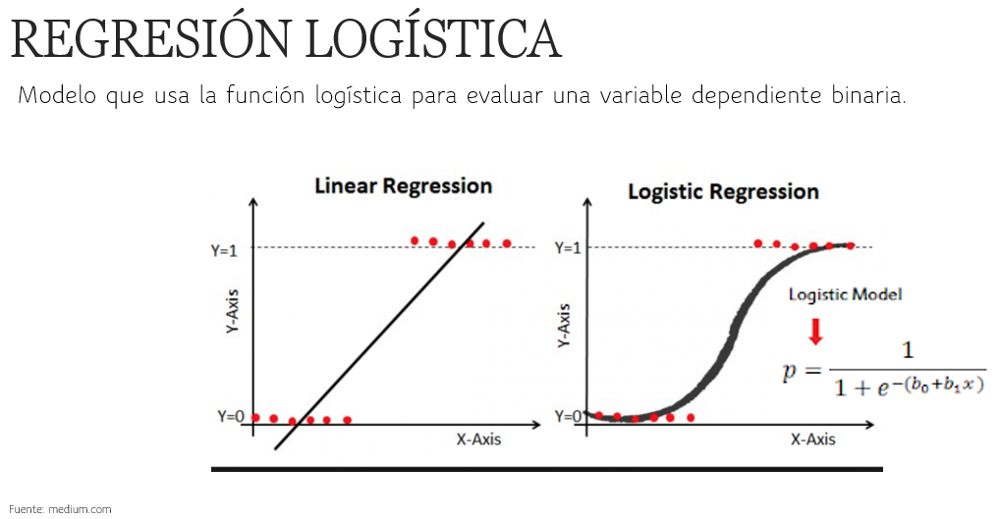

In [76]:
#Definimos los datasets X e y con la variable target y los predictores
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1987)

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/usr/local/lib/python3.6/dist-packages/sklearn/lin

Número óptimo de variables: 10
Variables seleccionadas: ['Age', 'Is Male', 'Embarked S', 'Embarked C', 'Embarked Q', 'Title Master', 'Pclass 1', 'Pclass 2', 'Pclass 3', 'Family Size']


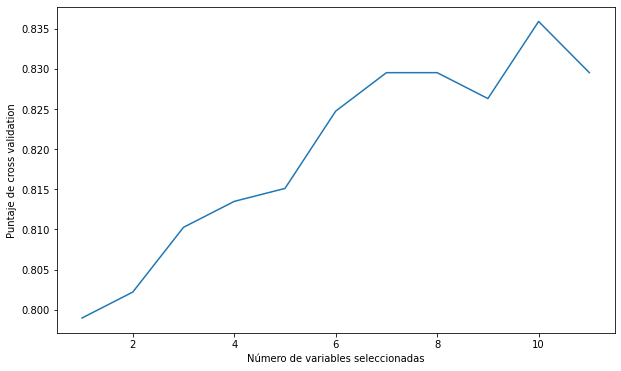

In [77]:
#Importar librerías
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFECV

# Creando el objeto de RFE con cross validation
rfecv = RFECV(estimator=LogisticRegression(), step=1, cv=10, scoring='accuracy')
rfecv.fit(X_train, y_train)

print("Número óptimo de variables: %d" % rfecv.n_features_)
print("Variables seleccionadas: %s" % list(X.columns[rfecv.support_]))

#Evaluar gráficamente
plt.figure(figsize=(10,6))
plt.xlabel("Número de variables seleccionadas")
plt.ylabel("Puntaje de cross validation")
plt.plot(range(1, len(rfecv.grid_scores_) + 1), rfecv.grid_scores_)
plt.show()

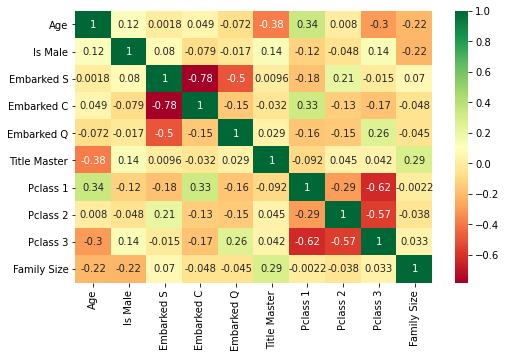

In [78]:
#Evaluar correlaciones con dichas variables
variables = ['Age', 'Is Male', 'Embarked S', 'Embarked C', 'Embarked Q', 'Title Master', 'Pclass 1', 'Pclass 2', 'Pclass 3', 'Family Size']
X2_train = X_train[variables]

plt.subplots(figsize=(8, 5))
sns.heatmap(X2_train.corr(), annot=True, cmap="RdYlGn")
plt.show()

In [79]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, classification_report, precision_score, recall_score 
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc, log_loss

#Ajustando según las nuevas variables
X2 = df2[variables]
y2 = df2['Survived']

#Nuevos set de train y test
X_train, X_test, y_train, y_test = train_test_split(X2, y2, test_size=0.2, random_state=2)

#Correr el modelo Regresión Logística
lmodel2 = LogisticRegression()
lmodel2.fit(X_train, y_train)


y_pred = lmodel2.predict(X_test)
y_pred_proba = lmodel2.predict_proba(X_test)[:, 1]
[fpr, tpr, thr] = roc_curve(y_test, y_pred_proba)




/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



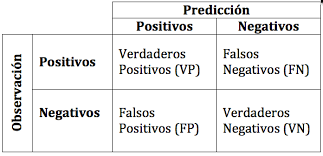

In [80]:
#Matriz de confusión

from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, y_pred)

array([[97, 14],
       [17, 50]])

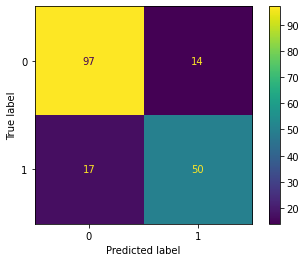

In [81]:
#Matriz de confusión con formato

from sklearn.metrics import plot_confusion_matrix
plot_confusion_matrix(lmodel2, X_test, y_test) 
plt.show() 

Curva ROC

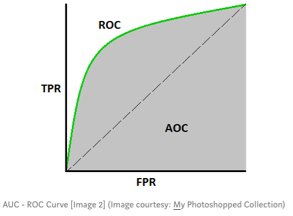

Resultados Train/Test split:
LogisticRegression accuracy 0.826
LogisticRegression log_loss 0.441
LogisticRegression auc 0.860


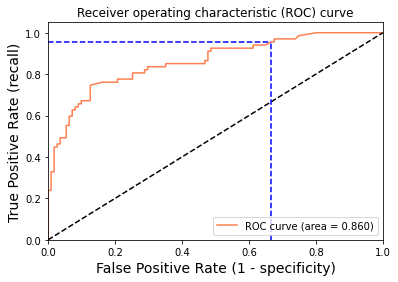

In [82]:
#ROC Curve

print('Resultados Train/Test split:')
print(lmodel2.__class__.__name__+" accuracy %2.3f" % accuracy_score(y_test, y_pred))
print(lmodel2.__class__.__name__+" log_loss %2.3f" % log_loss(y_test, y_pred_proba))
print(lmodel2.__class__.__name__+" auc %2.3f" % auc(fpr, tpr))

idx = np.min(np.where(tpr > 0.95)) #index para el primer threshold donde sensibility > 0.95

plt.figure()
plt.plot(fpr, tpr, color='coral', label='ROC curve (area = %0.3f)' % auc(fpr, tpr))
plt.plot([0, 1], [0, 1], 'k--')
plt.plot([0,fpr[idx]], [tpr[idx],tpr[idx]], 'k--', color='blue')
plt.plot([fpr[idx],fpr[idx]], [0,tpr[idx]], 'k--', color='blue')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate (1 - specificity)', fontsize=14)
plt.ylabel('True Positive Rate (recall)', fontsize=14)
plt.title('Receiver operating characteristic (ROC) curve')
plt.legend(loc="lower right")
plt.show()

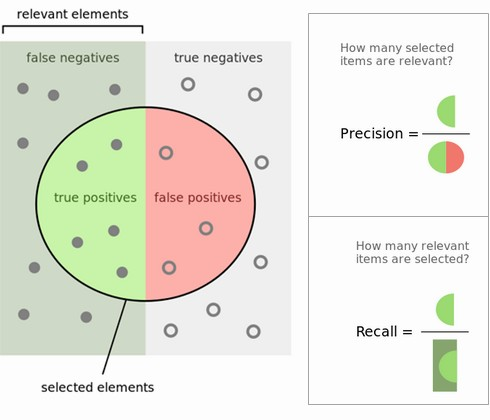

In [83]:
#Reporte de clasificación

from sklearn.metrics import classification_report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.85      0.87      0.86       111
           1       0.78      0.75      0.76        67

    accuracy                           0.83       178
   macro avg       0.82      0.81      0.81       178
weighted avg       0.82      0.83      0.83       178



# Árbol de decisión


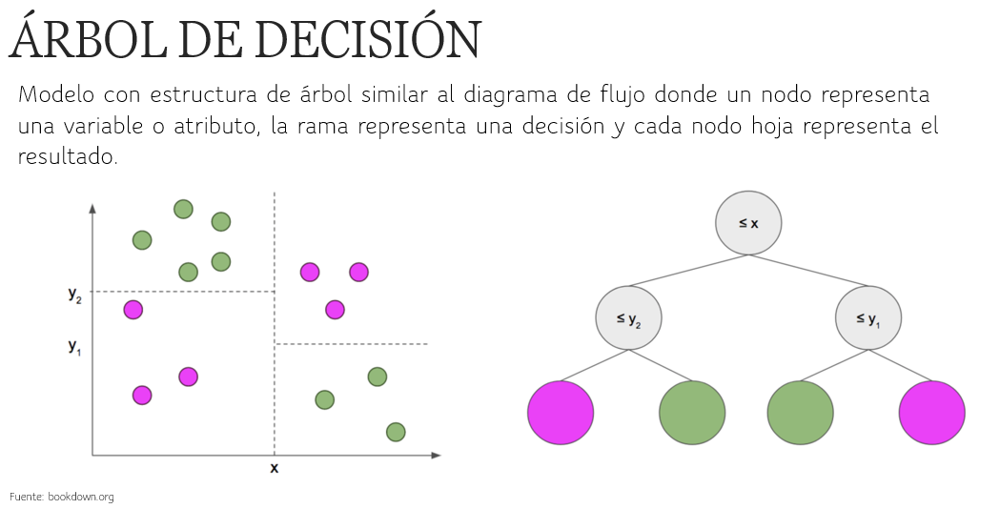

In [84]:
from sklearn import tree
from sklearn.metrics import accuracy_score, confusion_matrix

tree_model = tree.DecisionTreeClassifier()
tree_model = tree_model.fit(X_train, y_train)

In [85]:
#Revisar el score "accuracy" del modelo
tree_model_accuracy = round(tree_model.score(X_train, y_train), 4)
print("Accuracy: %0.4f" % (tree_model_accuracy))

Accuracy: 0.9353


In [86]:
#Predecir en el test set
y_pred = tree_model.predict(X_test)

# Revisar la matriz de confusión ([TN,FN],[FP,TP])
confusion_matrix(y_test,y_pred)

array([[96, 15],
       [20, 47]])

In [87]:
#Revisar el accuracy en el test set
accuracy_score(y_test, y_pred)

0.8033707865168539

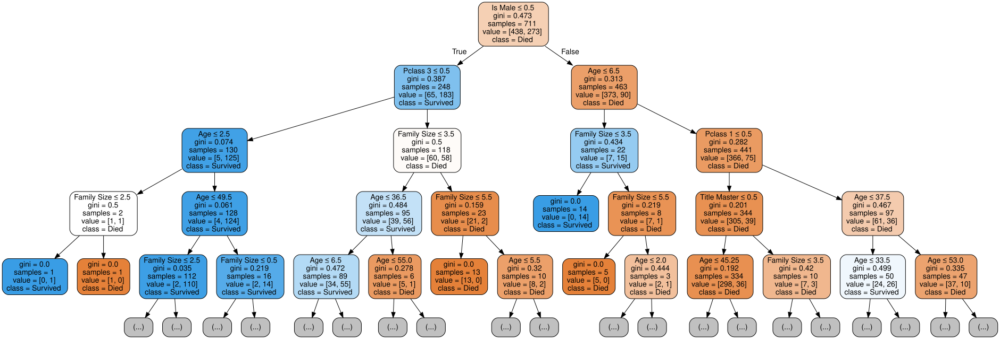

In [88]:
#Evaluar el modelo de forma gráfica
import graphviz 

dot_data = tree.export_graphviz(tree_model, 
                                out_file=None,
                                filled=True, 
                                rounded=True, 
                                max_depth = 4, 
                                special_characters=True,
                                class_names = ['Died', 'Survived'],
                               feature_names = X_train.columns) 
graph = graphviz.Source(dot_data)
graph

# Clustering

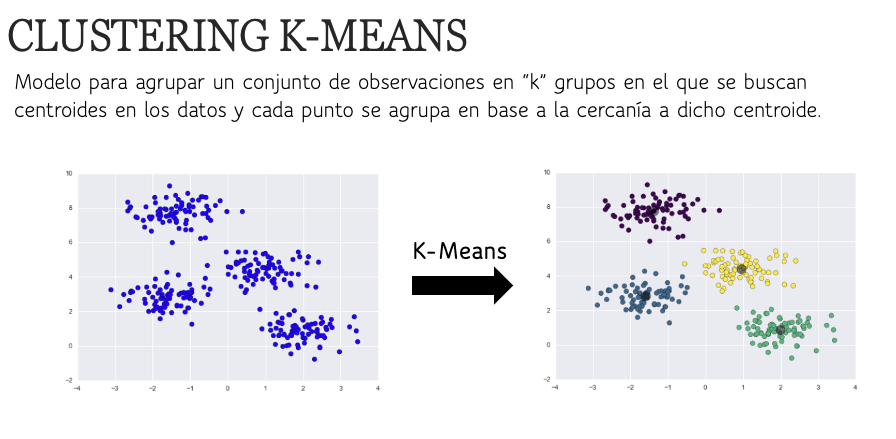

In [92]:
y = df2["Survived"]
X = df2.drop(["Survived"],axis=1)

In [93]:
from sklearn.cluster import KMeans

#Definiendo los parámetros del modelo
kmeans_kwargs = {
    "init": "random",
    "n_init": 10,
    "max_iter": 300,
    "random_state": 42,
    }
  
#SSE para cada valor de k
sse = []
for k in range(1, 11):
  kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
  kmeans.fit(X)
  sse.append(kmeans.inertia_)

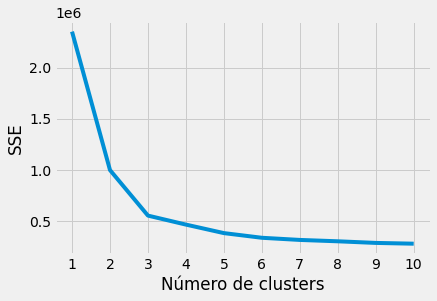

In [94]:
plt.style.use("fivethirtyeight")
plt.plot(range(1, 11), sse)
plt.xticks(range(1, 11))
plt.xlabel("Número de clusters")
plt.ylabel("SSE")
plt.show()

In [96]:
#Modelo de K-means
kmeans = KMeans(n_clusters=2)
kmeans.fit(X)
y_kmeans = kmeans.predict(X)


In [97]:
#Creando el dataset en donde se incluye el número de cluster
df3 = df2.copy()
df3["cluster"] = y_kmeans

df3.head()

,Survived,Age,Fare,Is Male,Embarked S,Embarked C,Embarked Q,Title Master,Pclass 1,Pclass 2,Pclass 3,Family Size,cluster
0,0,22.0,7.2500,1,1,0,0,0,0,0,1,1,0
1,1,38.0,71.2833,0,0,1,0,0,1,0,0,1,0
2,1,26.0,7.9250,0,1,0,0,0,0,0,1,0,0
3,1,35.0,53.1000,0,1,0,0,0,1,0,0,1,0
4,0,35.0,8.0500,1,1,0,0,0,0,0,1,0,0


In [98]:
#Evaluamos ambos clusters en base a su sobrevivencia

df3.groupby("cluster")["Survived"].mean()

cluster
0    0.360048
1    0.735849
Name: Survived, dtype: float64

In [99]:
#Ahora evaluamos los predictores en base a dichos clusters

df3.groupby("cluster")["Survived","Is Male","Pclass 1","Family Size"].median().reset_index()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,cluster,Survived,Is Male,Pclass 1,Family Size
0,0,0,1,0,0
1,1,1,0,1,1


In [100]:
#Y adicionalmente los predictores en base al promedio de su valor, en lugar de la mediana

df3.groupby("cluster")["Survived","Is Male","Pclass 1","Family Size"].mean().reset_index()

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,cluster,Survived,Is Male,Pclass 1,Family Size
0,0,0.360048,0.667464,0.192584,0.866029
1,1,0.735849,0.358491,1.000000,1.547170


In [101]:
from sklearn.metrics import silhouette_score

# Compute the silhouette scores for each algorithm
kmeans_silhouette = silhouette_score(X, kmeans.labels_).round(2)

kmeans_silhouette

0.79

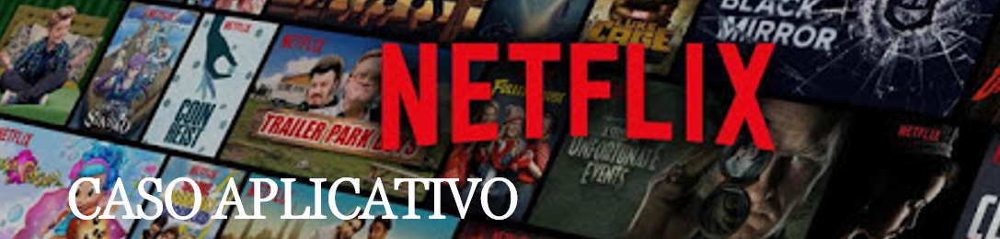

Ahora vamos a correr los modelos que seleccionemos a nuestro caso aplicativo

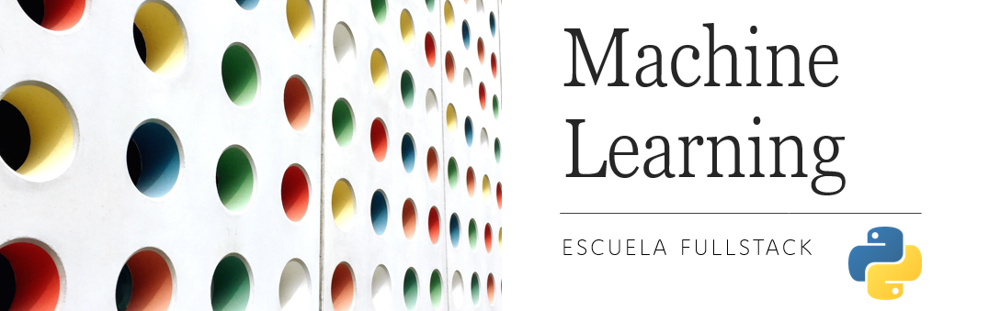

In [102]:
dfp1.head()

,show_id,type,title,director,cast,country,date_added,release_year,rating_Netflix,duration,listed_in,description,year,rating_IMDB,genre,day_added,year_added,month_added,Is_movie,duration_num,Genre_Adventure,Genre_Comedy,Genre_Drama,Genre_Crime,Genre_Thriller,Genre_Action,Genre_Animation,Genre_Romance,Genre_Mystery,Genre_SciFi,Genre_Musical,Genre_Family,United_States,India,United_Kingdom,China,Canada,Germany,France,Australia,Mexico,Spain,South_Korea,Belgium
0,81145628,Movie,Norm of the North: King Sized Adventure,"Richard Finn, Tim Maltby","Alan Marriott, Andrew Toth, Brian Dobson, Cole...","United States, India, South Korea, China",2019-09-09,2019,TV-PG,90 min,"Children & Family Movies, Comedies",Before planning an awesome wedding for his gra...,2019,3.2,"Animation, Adventure, Comedy",9,2019,9,1,90,1,1,0,0,0,0,1,0,0,0,0,0,1,1,0,1,0,0,0,0,0,0,1,0
1,70304990,Movie,Good People,Henrik Ruben Genz,"James Franco, Kate Hudson, Tom Wilkinson, Omar...","United States, United Kingdom, Denmark, Sweden",2017-09-08,2014,R,90 min,"Action & Adventure, Thrillers",A struggling couple can't believe their luck w...,2014,5.5,"Action, Crime, Thriller",8,2017,9,1,90,0,0,0,1,1,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0
2,70299204,Movie,Kidnapping Mr. Heineken,Daniel Alfredson,"Jim Sturgess, Sam Worthington, Ryan Kwanten, A...","Netherlands, Belgium, United Kingdom, United S...",2017-09-08,2015,R,95 min,"Action & Adventure, Dramas, International Movies","When beer magnate Alfred ""Freddy"" Heineken is ...",2015,6.1,"Action, Crime, Drama",8,2017,9,1,95,0,0,1,1,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,1
3,80057969,Movie,Love,Gaspar Noé,"Karl Glusman, Klara Kristin, Aomi Muyock, Ugo ...","France, Belgium",2017-09-08,2015,NR,135 min,"Cult Movies, Dramas, Independent Movies",A man in an unsatisfying marriage recalls the ...,1927,7.0,"Drama, Romance",8,2017,9,1,135,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1
4,80057969,Movie,Love,Gaspar Noé,"Karl Glusman, Klara Kristin, Aomi Muyock, Ugo ...","France, Belgium",2017-09-08,2015,NR,135 min,"Cult Movies, Dramas, Independent Movies",A man in an unsatisfying marriage recalls the ...,1991,5.9,"Drama, Musical, Romance",8,2017,9,1,135,0,0,1,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1


Ya que tenemos 2 tipos de programas distintos: películas y series, vamos a evaluar solo uno de ellos.

Realizaremos el análisis evaluando las películas


In [103]:
#Filtramos solo películas
dfp2 = dfp2[dfp2["Is_movie"]==1]

#Ahora volvemos a preparar el set de training y test
yp = dfp2["rating_IMDB"]
Xp = dfp2.drop(["rating_IMDB"],axis=1)

X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(Xp, yp, test_size=0.3, random_state=1987)

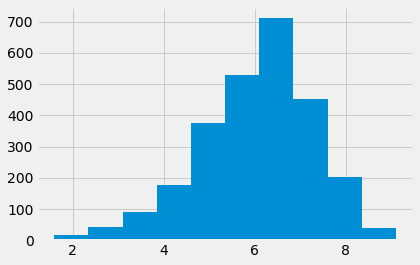

In [104]:
#Revisando el histograma de la variable target

plt.hist(yp)
plt.show()

In [105]:
#BONUS: Usando un modelo Random Forest para Feature Selection

from sklearn.ensemble import RandomForestRegressor
from matplotlib import pyplot

# define the model
model = RandomForestRegressor()
# fit the model
model.fit(Xp, yp)
# get importance
importance = model.feature_importances_


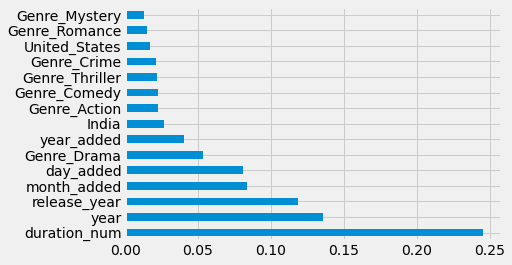

In [106]:
#Ploteando las variables más relevantes
feat_importances = pd.Series(model.feature_importances_, index=Xp.columns)
feat_importances.nlargest(15).plot(kind='barh')

In [107]:
#Filtramos solo las variables más relevantes para nuestros siguientes pasos

variables = feat_importances.sort_values(ascending=False)[0:15].index

dfp3 = dfp2[variables]
dfp3["rating_IMDB"] = dfp2["rating_IMDB"]

yp = dfp3["rating_IMDB"]
Xp = dfp3.drop(["rating_IMDB"],axis=1)

X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(Xp, yp, test_size=0.3, random_state=1987)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



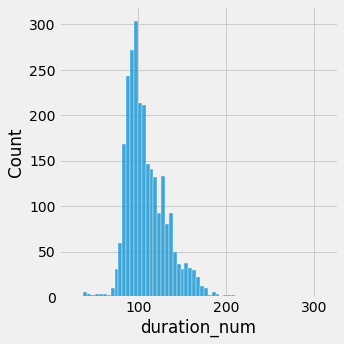

In [108]:
#Visualizamos la distribución de duración

sns.displot(Xp["duration_num"])
plt.show()

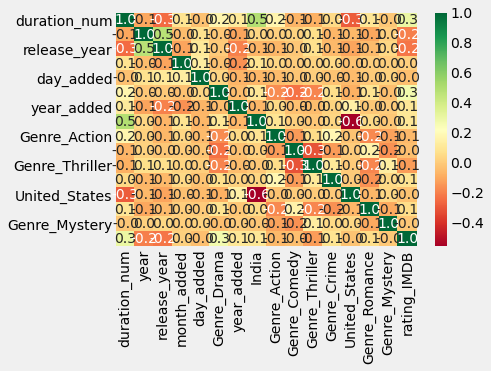

In [109]:
#Evaluando una matriz de correlación en formato heatmap

sns.heatmap(dfp3.corr(), cmap="RdYlGn", annot=True, fmt=".1f")
plt.show()

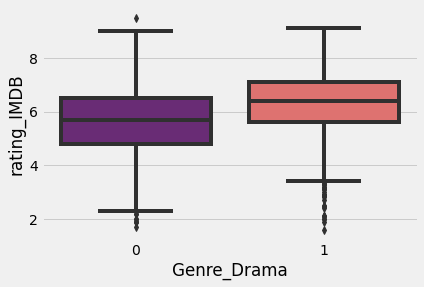

In [110]:
#Evaluando la variable target en base a las demás

sns.boxplot(x='Genre_Drama', y='rating_IMDB', data=dfp1,palette="magma")
plt.show()

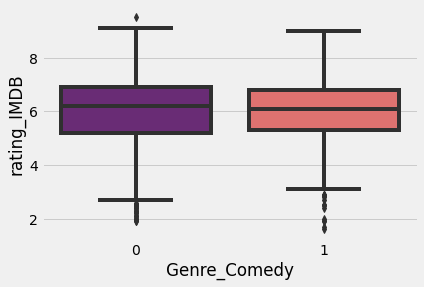

In [111]:
#Evaluando la variable target en base a las demás

sns.boxplot(x='Genre_Comedy', y='rating_IMDB', data=dfp1,palette="magma")
plt.show()

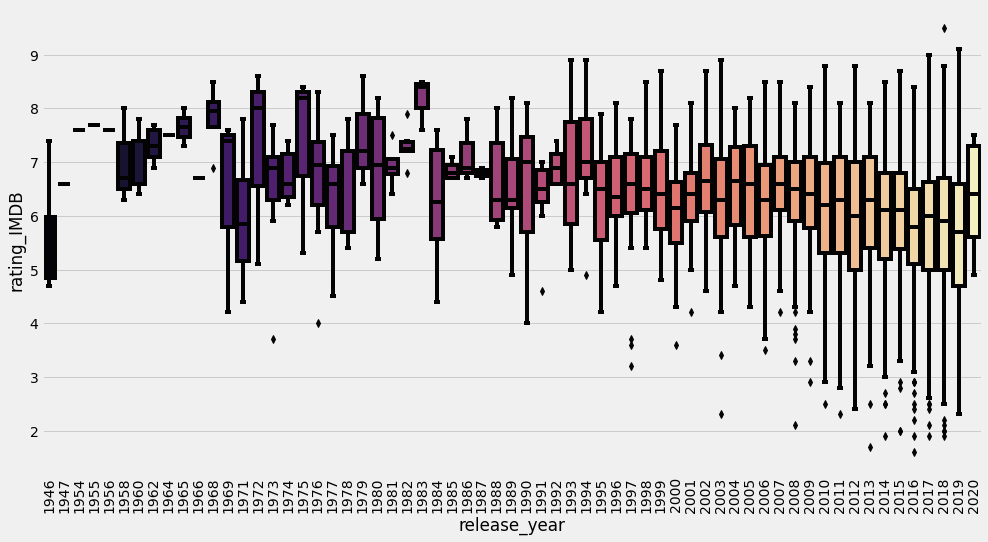

In [112]:
#Evaluando la variable target en base a las demás

plt.figure(figsize=(15,8))

sns.boxplot(x='release_year', y='rating_IMDB', data=dfp1,palette="magma")
plt.xticks(rotation=90)
plt.show()

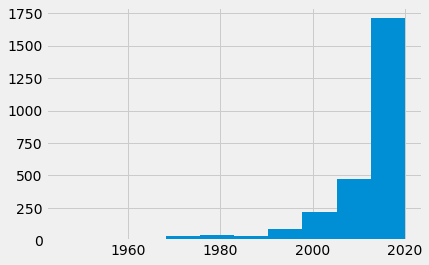

In [113]:
#Revisando la frecuencia por año

plt.hist(Xp["release_year"])
plt.show()

In [114]:
#Removiendo shows de antes de 1990

dfp4 = dfp3[dfp3["release_year"]>=1990]

yp = dfp4["rating_IMDB"]
Xp = dfp4.drop(["rating_IMDB"],axis=1)

X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(Xp, yp, test_size=0.3, random_state=1987)

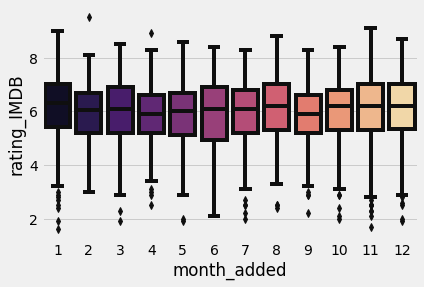

In [115]:
#Evaluando la variable target en base a las demás

sns.boxplot(x='month_added', y='rating_IMDB', data=dfp1,palette="magma")
plt.show()

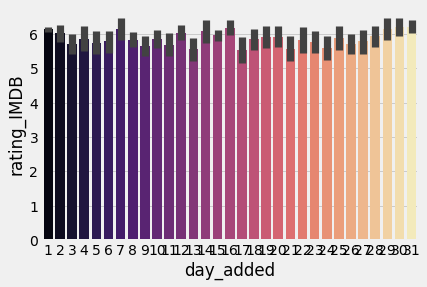

In [116]:
#Evaluando la variable target en base a las demás

sns.barplot(x='day_added', y='rating_IMDB', data=dfp1,palette="magma")
plt.show()

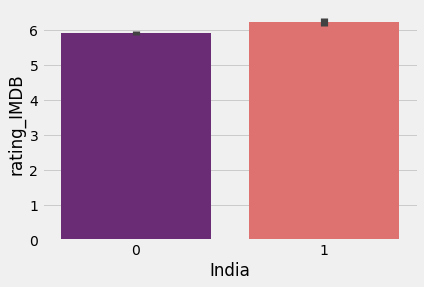

In [117]:
#Evaluando la variable target en base a las demás

sns.barplot(x='India', y='rating_IMDB', data=dfp1,palette="magma")
plt.show()

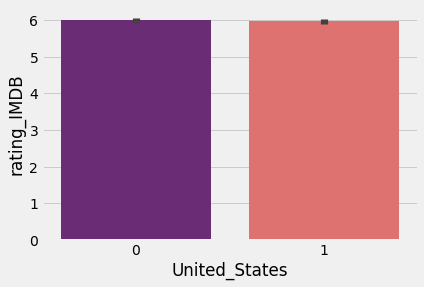

In [118]:
#Evaluando la variable target en base a las demás

sns.barplot(x='United_States', y='rating_IMDB', data=dfp1,palette="magma")
plt.show()

In [119]:
#Añadiendo una constante para el cálculo del Intercept
X_train_p = sm.add_constant(X_train_p)

#Entrenamos el modelo
modelp = sm.OLS(y_train_p,X_train_p).fit()

print(modelp.summary())

                            OLS Regression Results                            
Dep. Variable:            rating_IMDB   R-squared:                       0.185
Model:                            OLS   Adj. R-squared:                  0.178
Method:                 Least Squares   F-statistic:                     26.33
Date:                Sun, 04 Oct 2020   Prob (F-statistic):           6.75e-67
Time:                        17:40:46   Log-Likelihood:                -2667.5
No. Observations:                1751   AIC:                             5367.
Df Residuals:                    1735   BIC:                             5454.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
const             19.0842     58.819      0.

In [120]:
#Añadiendo una constante para el cálculo del Intercept
X_test_p = sm.add_constant(X_test_p)

#Predicción en el dataset de test
y_pred_p = modelp.predict(X_test_p)

#RMSE
print(np.sqrt(metrics.mean_squared_error(y_test_p, y_pred_p)))

1.1140279306466068


In [121]:
#Removiendo columnas con alto p-value

yp = dfp4["rating_IMDB"]
Xp = dfp4.drop(["rating_IMDB","year_added","day_added","month_added","United_States","Genre_Romance","India"
                ,"Genre_Comedy","Genre_Thriller","Genre_Mystery"],axis=1)

X_train_p, X_test_p, y_train_p, y_test_p = train_test_split(Xp, yp, test_size=0.3, random_state=1987)

In [122]:
#Añadiendo una constante para el cálculo del Intercept
X_train_p = sm.add_constant(X_train_p)

#Entrenamos el modelo
modelp = sm.OLS(y_train_p,X_train_p).fit()

print(modelp.summary())

                            OLS Regression Results                            
Dep. Variable:            rating_IMDB   R-squared:                       0.178
Model:                            OLS   Adj. R-squared:                  0.175
Method:                 Least Squares   F-statistic:                     62.80
Date:                Sun, 04 Oct 2020   Prob (F-statistic):           1.01e-70
Time:                        17:42:17   Log-Likelihood:                -2675.8
No. Observations:                1751   AIC:                             5366.
Df Residuals:                    1744   BIC:                             5404.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const           65.4835      9.384      6.978   

In [123]:
#Añadiendo una constante para el cálculo del Intercept
X_test_p = sm.add_constant(X_test_p)

#Predicción en el dataset de test
y_pred_p = modelp.predict(X_test_p)

#RMSE
print(np.sqrt(metrics.mean_squared_error(y_test_p, y_pred_p)))

1.1153817380519855


In [124]:
#Creando un modelo de árbol de decisión

tree_modelp = tree.DecisionTreeRegressor()
tree_modelp = tree_modelp.fit(X_train_p, y_train_p)

In [125]:
#Revisar el score "accuracy" del modelo
tree_model_accuracy = round(tree_modelp.score(X_train_p, y_train_p), 4)
print("Accuracy: %0.4f" % (tree_model_accuracy))

Accuracy: 0.9172


In [126]:
#Predecir en el test set
y_pred = tree_model.predict(X_test)

In [127]:
#Revisar el accuracy en el test set
accuracy_score(y_test, y_pred)

0.8033707865168539

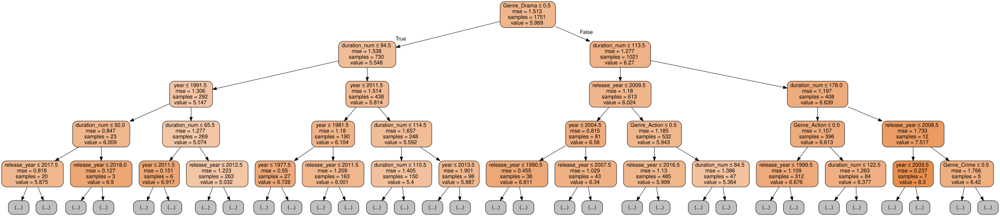

In [128]:
#Evaluar el modelo de forma gráfica
import graphviz 

dot_data = tree.export_graphviz(tree_modelp, 
                                out_file=None,
                                filled=True, 
                                rounded=True, 
                                max_depth = 4, 
                                special_characters=True,
                                class_names=True,
                               feature_names = X_train_p.columns) 
graph = graphviz.Source(dot_data)
graph